## Introdução
O objetivo desse relatório é:
1. Calcular a informação espacial das imagens.
2. Testar o efeito da janela de expansão e redução
- 2.1 Para 2x2, 3x3, 4x4, 5x5 
    * Média
    * Moda
    * Mediana
- 2.2 Usar os métodos de interpolação do OpenCV.
3. Avaliar as imagens geradas a partir de métricas objetivas.

## Importar as bibliotecas utilizadas.

In [1]:
import os
import sys
import glob
import cv2
import copy
import matplotlib.pyplot as plt
import copy
import numpy as np

## Carregar as imagens

In [2]:
PATH_IMGS = os.path.join('..', 'flickr')
imgs_pequenas = glob.glob(PATH_IMGS+os.path.sep+'pequena*')
imgs_grandes = glob.glob(PATH_IMGS+os.path.sep+'grande*')

In [13]:
print(f'lista de imagens pequenas:')
imgs_pequenas

lista de imagens pequenas:


['../flickr/pequena_praia150.jpg',
 '../flickr/pequena_cachorro150.jpg',
 '../flickr/pequena_carro150.jpg',
 '../flickr/pequena_espaco.jpg']

In [14]:
print(f'lista de imagens grandes:')
imgs_grandes

lista de imagens grandes:


['../flickr/grande_espaco800.jpg',
 '../flickr/grande_praia500.jpg',
 '../flickr/grande_cachorro800.jpg',
 '../flickr/grande_carro640.jpg']

# Calcular a informação espacial das imagens.

# Testar o efeito da janela de expansão e redução.

## Para média, moda e mediana testar 2x2, 3x3, 4x4 e 5x5.

## Usar os métodos de interpolação do OpenCV.

* INTER_AREA: INTER_AREA usa relação de área de pixel para reamostragem. Isso é mais adequado para reduzir o tamanho de uma imagem (encolhimento). Quando usado para ampliar a imagem, ele usa o método INTER_NEAREST.

* INTER_CUBIC: Usa interpolação bicúbica para redimensionar a imagem. Ao redimensionar e interpolar novos pixels, este método atua nos 4×4 pixels vizinhos da imagem. Em seguida, leva a média de pesos dos 16 pixels para criar o novo pixel interpolado.

* INTER_LINEAR: Este método é um pouco semelhante à interpolação INTER_CUBIC. Mas, ao contrário de INTER_CUBIC, este usa 2×2 pixels vizinhos para obter a média ponderada do pixel interpolado.

* INTER_NEAREST: O método INTER_NEAREST usa o conceito de vizinho mais próximo para interpolação. Este é um dos métodos mais simples, usando apenas um pixel vizinho da imagem para interpolação.

* Interpolação de Lanczos sobre o vizinho 8x8

### Função para exibir os 5 metódos de interpolação do opencv.

In [5]:
def interpolar(img, dim):
    fig = plt.figure(figsize=(dim[0]/10,dim[1]/10))
    labels = ['NEAREST', 'LINEAR', 'AREA', 'CUBIC', 'LANCZ']
    img = cv2.imread(img)
    resized_nearest = cv2.resize(img, dim, interpolation=cv2.INTER_NEAREST)
    resized_linear = cv2.resize(img, dim, interpolation=cv2.INTER_LINEAR)
    resized_area = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
    resized_cubic = cv2.resize(img, dim, interpolation=cv2.INTER_CUBIC)
    resized_lanc = cv2.resize(img, dim, interpolation=cv2.INTER_LANCZOS4)
    
    imgs_processadas = [] 
    imgs_processadas.extend([resized_nearest, resized_linear, resized_area, resized_cubic, resized_lanc])

    for j in range(0, len(imgs_processadas)):
        plt.subplot(5, 1, j+1)
        img = cv2.cvtColor(imgs_processadas[j], cv2.COLOR_BGR2RGB)
        plt.title(labels[j])
        plt.imshow(img)
    plt.show()

### Expansão das imagens pequenas para uma resolução de 800x800.

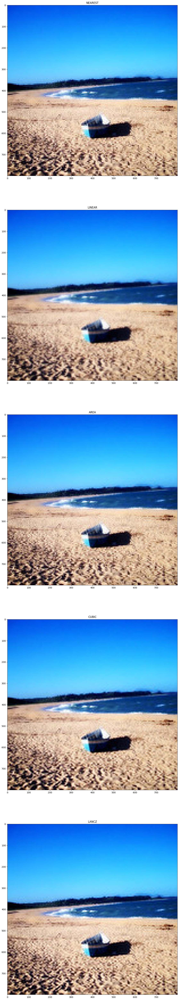

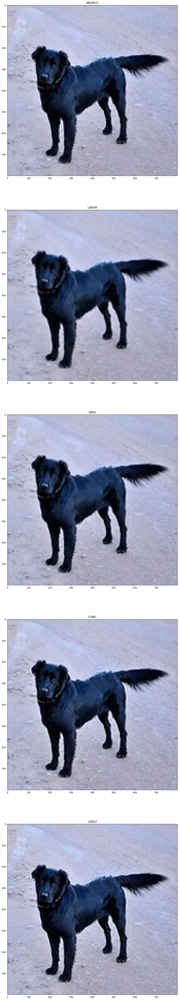

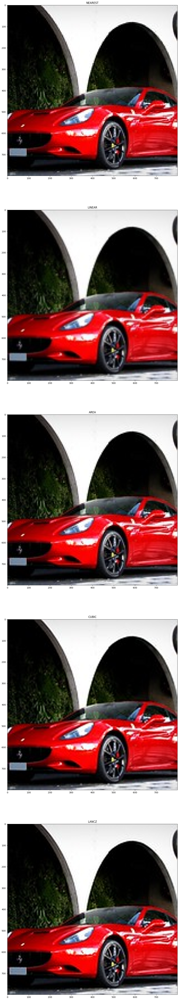

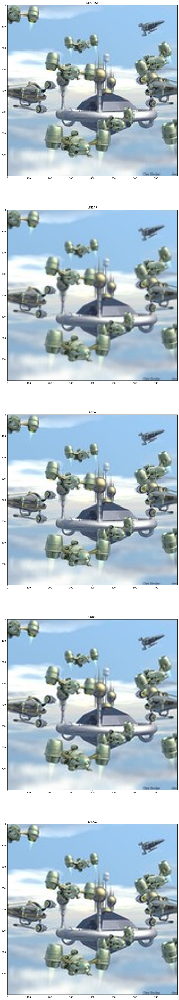

In [6]:
for imgs in imgs_pequenas:
    interpolar(imgs, (800,800))

#### Conclusão : 
* Notamos que os métodos NEAREST E AREA tornaram as imagens mais pixeladas, já esperado pela definição que a AREA utiliza a NEAREST quando ampliam as imagens.

### Redução das imagens grandes para uma resolução de 200x200.

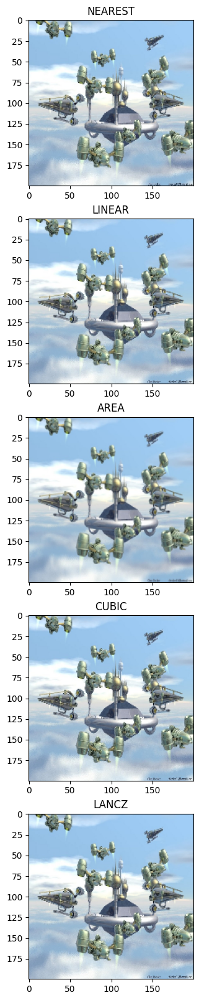

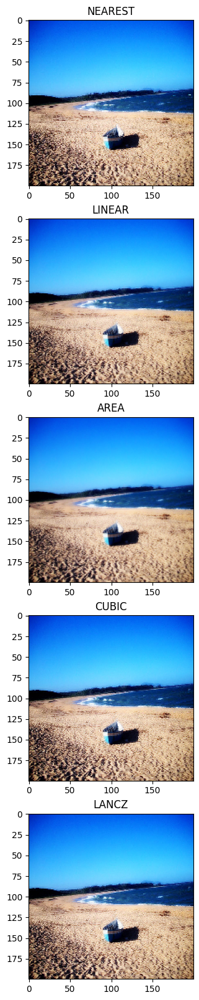

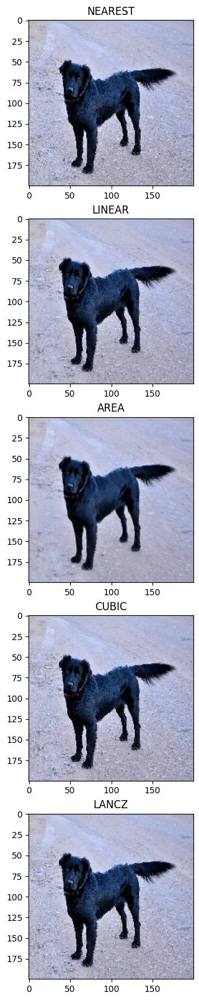

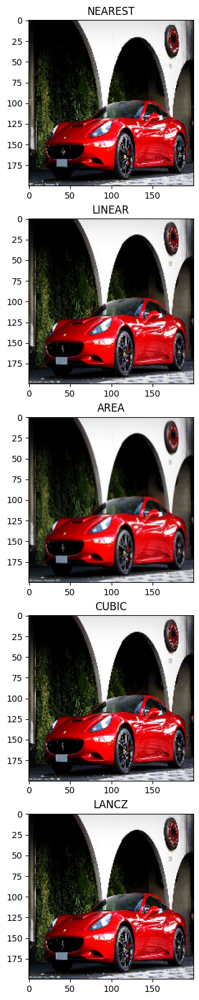

In [7]:
for imgs in imgs_grandes:
    interpolar(imgs, (200,200))

#### Conclusão : 
* Para redução as diferenças são mais sutis, ficando dificil uma avaliação subjetiva, porém notamos no método da AREA um blurred maior nas imagens. 

# Avaliar as imagens geradas a partir de métricas objetivas.

## PSNR

## SSIM